# TF Image Classification for Belle Epoque Posters: Cultural vs. Tourism vs. Retail

## PART 1 - Data Collection and Preprocessing

**AUTHOR: CAMELIA CIOLAC**  
ciolac_c@inria-alumni.fr

In this mini-project we train a Tensorflow model to perform multiclass classification on images of old posters, dating from the Belle Epoque period in France.  The classifier is trained to predict if a given poster had a cultural focus (theater, exposition), promoted a touristic destination, or if it had a retail focus (product, store).   
The image set is gathered from various museums collections in France and target the late XIX century and early XX century.  
In the preprocessing stage we deduplicate images based on image hashing (fingerprinting) and we use OpenCV to remove bottom border when this contained museum -added metadata.  
For the model we use declarative ML (based on YAML config files) and several custom callbacks.  
In the end, we experiment with an ensemble of top best performing models, whose hyperparams are searched for automatically. 



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Circle
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

import seaborn as sns
%matplotlib inline

In [ ]:
!mkdir -p "/content/gdrive/My Drive/belle_epoque"

In [ ]:
!sudo apt-get install tree > /dev/null 2>&1

#for images duplicates finding
!pip install -q ImageHash 
!pip install -q annoy

#for handling accents in strings
!pip install -q Unidecode


     |████████████████████████████████| 296kB 12.0MB/s 
     |████████████████████████████████| 655kB 10.8MB/s 
     |████████████████████████████████| 245kB 12.7MB/s 


Restart runtime now in Colab for the setup to be fully operational.

In [ ]:
import pandas as pd
import numpy as np
import math
import scipy.interpolate
import scipy.stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from PIL import Image as pilim
import collections as coll

import pprint
from tabulate import tabulate

import os
from multiprocessing.pool import ThreadPool
import psutil

import glob
import json
import shutil
import time

import yaml

import unittest

import uuid

import re
#for removing/handling accents:
import unidecode
import unicodedata

import imagehash
from annoy import AnnoyIndex
from scipy.spatial import distance

import operator
from itertools import groupby

import pickle
from shutil import copyfile

import networkx as nx

import cv2
cv2.__version__

'4.1.2'

In [ ]:
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    warnings.filterwarnings("ignore",category=FutureWarning)
    

#to mute SettingWithCopyWarning
pd.options.mode.chained_assignment = None

In [ ]:
#print options for pandas

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
def utility_print_lists_columnized(long_list, num_cols_columnize = 5):
    """ columnize print of list of strings"""
    
    num_columns = num_cols_columnize
    num_rows = int(len(long_list)/num_columns) 

    list_aux = []
    for ii in range(num_rows):
        list_aux.append(long_list[num_columns * ii: num_columns *(ii+1)])

    list_aux.append(long_list[num_columns * num_rows:])

    print(tabulate(list_aux, tablefmt="plain"))

# Data collection

## Download a set of images

Sources of images for the dataset:

- https://www.parismuseescollections.paris.fr/fr/ 
- https://gallica.bnf.fr  
- http://www.collections.musee-bretagne.fr 
- https://numelyo.bm-lyon.fr/collection/BML:BML_02AFF01000COL01 
- http://musee-breton.finistere.fr/fr/collections/la-collection-d-affiches-anciennes  
- https://francearchives.fr 
- https://recherche.archives.somme.fr/ 

In [ ]:
FOLDER_IMAGES = "/content/gdrive/My Drive/belle_epoque/museums_collections/"

In [ ]:
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | grep .jpeg | wc -l
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | grep .JPEG | wc -l
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | grep .jpg | wc -l
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | grep .JPG | wc -l
!echo "------------------------------------------------------------"

# plus some nonimg files  
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | wc -l

88
1379
180
1
------------------------------------------------------------
1651


### Change files' extension:

In [ ]:
#make all extensions to be .jpg
%%bash

cd "/content/gdrive/My Drive/belle_epoque/museums_collections"

#loop through multiple file extensions and replace ending substr
for file in *.{JPEG,jpeg,JPG}
do
  if [ ${file: -5} == ".JPEG" ] 
  then
     mv "$file" "${file/.JPEG/.jpg}"
  fi
  if [ ${file: -4} == ".JPG" ] 
  then
     mv "$file" "${file/.JPG/.jpg}"
  fi
  if [ ${file: -5} == ".jpeg" ] 
  then
     mv "$file" "${file/.jpeg/.jpg}"
  fi
done




In [ ]:
!ls "/content/gdrive/My Drive/belle_epoque/museums_collections" | grep .jpg | wc -l

1648


### Rename files:

In [ ]:
list_jpgfiles = glob.glob(FOLDER_IMAGES + '/*.jpg')

#make a dataframe
df_filenames = pd.DataFrame({"filepath": list_jpgfiles})
assert(df_filenames.shape[0] == len(list_jpgfiles))

df_filenames["filename"] = df_filenames["filepath"].apply(lambda x: str(x.split("/")[-1]).strip())
df_aux = df_filenames[(~df_filenames["filename"].str.startswith("site100"))&(df_filenames["filename"].str[8:11]< "200")].sample(5)
df_aux

,filepath,filename
1152,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 165._btv1b90160681.jpg,site30_ 165._btv1b90160681.jpg
475,/content/gdrive/My Drive/belle_epoque/museums_collections/site90_ 17.FRAD080_55FI06.jpg,site90_ 17.FRAD080_55FI06.jpg
1094,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 100.Chéret_Jules_btv1b9015381m.jpg,site30_ 100.Chéret_Jules_btv1b9015381m.jpg
1172,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 185._btv1b9003167r.jpg,site30_ 185._btv1b9003167r.jpg
1125,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 136.Meunier_Georges_btv1b9011318m.jpg,site30_ 136.Meunier_Georges_btv1b9011318m.jpg


Note that some of the filenames include the artist' name,which we want to preserve.

Remove accents from artists names

In [ ]:
#how it works - unicode
s1 = "site30_ 100.Chéret_Jules_btv1b9015381m.jpg"
print("original: ", s1 , "--> ascii: ", ascii(s1))
print("unidecode:", unidecode.unidecode(s1),  "--> ascii: ", ascii(unidecode.unidecode(s1)))
print("nfc:      ", unicodedata.normalize("NFC",s1), "--> ascii: ", ascii(unicodedata.normalize("NFC",s1)))
print("nfd:      ", unicodedata.normalize("NFD",s1), "--> ascii: ", ascii(unicodedata.normalize("NFD",s1)))

print("-------------------------------------------------------")

#how it works - regex 
exp = re.compile("\.([A-Z,a-z,']+_)+", re.UNICODE)

#sidenote: accentuates chars are outside range [a-z]
print("If accents in text, the search result is:", exp.search(s1), "\n")

s_ = unidecode.unidecode(s1)
res = exp.search(s_)
print("If text without accents, the search result is:", res)

print("the span:", res.span())
print("the group:", res.group())

original:  site30_ 100.Chéret_Jules_btv1b9015381m.jpg --> ascii:  'site30_ 100.Che\u0301ret_Jules_btv1b9015381m.jpg'
unidecode: site30_ 100.Cheret_Jules_btv1b9015381m.jpg --> ascii:  'site30_ 100.Cheret_Jules_btv1b9015381m.jpg'
nfc:       site30_ 100.Chéret_Jules_btv1b9015381m.jpg --> ascii:  'site30_ 100.Ch\xe9ret_Jules_btv1b9015381m.jpg'
nfd:       site30_ 100.Chéret_Jules_btv1b9015381m.jpg --> ascii:  'site30_ 100.Che\u0301ret_Jules_btv1b9015381m.jpg'
-------------------------------------------------------
If accents in text, the search result is: None 

If text without accents, the search result is: <_sre.SRE_Match object; span=(11, 25), match='.Cheret_Jules_'>
the span: (11, 25)
the group: .Cheret_Jules_


In [ ]:
df_filenames["filename_noaccent"] = df_filenames["filename"].apply(lambda x: unidecode.unidecode(x))

exp = re.compile("\.([A-Z,a-z]+_)+", re.UNICODE)
df_filenames["regex"] = df_filenames["filename_noaccent"].apply(lambda x: exp.search(x))
df_filenames["artist"] = df_filenames["regex"].apply(lambda x: str(x.group())[1:-1] if x is not None else "")

df_filenames.iloc[df_aux.index]

,filepath,filename,filename_noaccent,regex,artist
1152,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 165._btv1b90160681.jpg,site30_ 165._btv1b90160681.jpg,site30_ 165._btv1b90160681.jpg,None,
475,/content/gdrive/My Drive/belle_epoque/museums_collections/site90_ 17.FRAD080_55FI06.jpg,site90_ 17.FRAD080_55FI06.jpg,site90_ 17.FRAD080_55FI06.jpg,None,
1094,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 100.Chéret_Jules_btv1b9015381m.jpg,site30_ 100.Chéret_Jules_btv1b9015381m.jpg,site30_ 100.Cheret_Jules_btv1b9015381m.jpg,"<_sre.SRE_Match object; span=(11, 25), match='.Cheret_Jules_'>",Cheret_Jules
1172,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 185._btv1b9003167r.jpg,site30_ 185._btv1b9003167r.jpg,site30_ 185._btv1b9003167r.jpg,None,
1125,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 136.Meunier_Georges_btv1b9011318m.jpg,site30_ 136.Meunier_Georges_btv1b9011318m.jpg,site30_ 136.Meunier_Georges_btv1b9011318m.jpg,"<_sre.SRE_Match object; span=(11, 28), match='.Meunier_Georges_'>",Meunier_Georges


In [ ]:
list_uniq_artists = sorted(list(df_filenames[df_filenames["artist"].str.len() > 0]["artist"].unique()))
utility_print_lists_columnized(long_list = list_uniq_artists, num_cols_columnize= 8)

A_F                 Argence_Eugene      Armengol_Henri       Atche_Jane          Atelier_Faria       Ateliers_Hugo         Aurrens_Henri       Auzolle_Marcellin
Balluriau_Paul      Barbizet_Antoine    Barrere_Adrien       Bayard_Emile        Baylac_Lucien       Belon_Jose            Berardi_E           Berchmans_Emile
Berge_L             Berthon_Paul        Berti_Renato         Biais_Maurice       Bignami_Vespasiano  Biquard_Armand        Birck_Alphonse      Bouisset_Firmin
Boutet_de           Brun_A              Brun_Ch              Butscha_Emile       Buval_Ernest        Cachoud_Francois      Cappiello_Leonetto  Carlegle
Carrer_Fonction     Cazaneuve_Edouard   Chadel_Jules         Chaudoir_Felix      Cheret              Cheret_Jules          Choubrac_Alfred     Choubrac_Leon
Chouquet_L          Colin_H             Dalbono_Edoardo      Dameron_Emile       Denis_Louis         Dorville_Noel         Dumont_Henri        E_F
Elzingre_Edouard    Ener                Evenepoel_Henri      Faiv

In [ ]:
def rename_by_uuid(row):
    """ given a dataframe row, use the values in columns filename and regex to
        generate a new filename where all except for the regex matched span and 
        for the extension is replaced  with a uuid """

    #the id we generate
    uniq_id = str(uuid.uuid4())

    filename = row["filename"]
    num_dots = filename.count('.')
    extension = filename[filename.rfind("."):]
    regex_result = row["regex"]

    if (num_dots == 1) or (regex_result is None):
        #just replace with uuid
        new_filename = uniq_id + extension
    else:
        #keep the artist
        regex_span = row["regex"].span()
        new_filename = uniq_id + "." + row["artist"] + extension

    return new_filename

In [ ]:
#test case

class TestRenameByUUID(unittest.TestCase):

    def test1(self):
        """ test1 - an original filename without artist"""
        row_i = df_filenames.iloc[1152]
        pprint.pprint(row_i.to_dict())
        new_filename = rename_by_uuid(row_i)   
        print("NEW FILENAME:", new_filename)  
        print("---------------------------------------")          
        self.assertEqual(new_filename.count("."), 1)

    def test2(self):
        """ test2 - an original filename with artist"""
        row_i = df_filenames.iloc[1094]
        pprint.pprint(row_i.to_dict())
        new_filename = rename_by_uuid(row_i)   
        print("NEW FILENAME:", new_filename)  
        print("---------------------------------------")   
        self.assertEqual(new_filename.count("."), 2)

    def test3(self):
        """ test3 - an original filename with artist"""
        row_i = df_filenames.iloc[1094]
        pprint.pprint(row_i.to_dict())
        new_filename = rename_by_uuid(row_i)   
        print("NEW FILENAME:", new_filename)  
        print("---------------------------------------")   
        self.assertIn(row_i["artist"], new_filename)



unittest.main(argv=[''], verbosity=1, exit=False)

...

{'artist': '',
 'filename': 'site30_ 165._btv1b90160681.jpg',
 'filename_noaccent': 'site30_ 165._btv1b90160681.jpg',
 'filepath': '/content/gdrive/My '
             'Drive/belle_epoque/museums_collections/site30_ '
             '165._btv1b90160681.jpg',
 'regex': None}
NEW FILENAME: 734c6d97-a787-4a79-95c0-1a6b17012200.jpg
---------------------------------------
{'artist': 'Cheret_Jules',
 'filename': 'site30_ 100.Chéret_Jules_btv1b9015381m.jpg',
 'filename_noaccent': 'site30_ 100.Cheret_Jules_btv1b9015381m.jpg',
 'filepath': '/content/gdrive/My '
             'Drive/belle_epoque/museums_collections/site30_ '
             '100.Chéret_Jules_btv1b9015381m.jpg',
 'regex': <_sre.SRE_Match object; span=(11, 25), match='.Cheret_Jules_'>}
NEW FILENAME: ff19b97f-e139-4f18-bd95-89a600f3b1fd.Cheret_Jules.jpg
---------------------------------------
{'artist': 'Cheret_Jules',
 'filename': 'site30_ 100.Chéret_Jules_btv1b9015381m.jpg',
 'filename_noaccent': 'site30_ 100.Cheret_Jules_btv1b9015381


----------------------------------------------------------------------
Ran 3 tests in 0.017s

OK


In [ ]:
df_filenames["new_filename"] = df_filenames.apply(lambda x: rename_by_uuid(x), axis=1)

df_filenames[["filepath", "filename","new_filename"]].iloc[df_aux.index]

,filepath,filename,new_filename
1152,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 165._btv1b90160681.jpg,site30_ 165._btv1b90160681.jpg,3a929885-8ce3-4812-93b4-50365166c6a4.jpg
475,/content/gdrive/My Drive/belle_epoque/museums_collections/site90_ 17.FRAD080_55FI06.jpg,site90_ 17.FRAD080_55FI06.jpg,09923ae5-68f5-4444-b1b7-3d4d290fd010.jpg
1094,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 100.Chéret_Jules_btv1b9015381m.jpg,site30_ 100.Chéret_Jules_btv1b9015381m.jpg,8cb2a737-355f-495e-976c-ffc378234384.Cheret_Jules.jpg
1172,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 185._btv1b9003167r.jpg,site30_ 185._btv1b9003167r.jpg,f079556b-841f-41da-9deb-0070350aefb1.jpg
1125,/content/gdrive/My Drive/belle_epoque/museums_collections/site30_ 136.Meunier_Georges_btv1b9011318m.jpg,site30_ 136.Meunier_Georges_btv1b9011318m.jpg,71b31023-12e0-445d-a97e-4bc73ed99279.Meunier_Georges.jpg


In [ ]:
for i,row in df_filenames.iterrows():
    old_path = row["filepath"]
    new_path = os.path.join(FOLDER_IMAGES, row["new_filename"])
    os.rename(old_path, new_path)

In [ ]:
df_filenames.to_json("/content/gdrive/My Drive/belle_epoque/museums_collections/df_filenames.json", orient = "records")

In [ ]:
list_jpgfiles = glob.glob(FOLDER_IMAGES + '/*.jpg')

### Visualize images sample

In [ ]:
def visualize_list_images(list_images, images_per_row = 5):
    """ visualize a list of images into a grid with specified images per row, 
       and titles the filenames' first 10 chars"""

    num_images_to_visualize =  len(list_images)
    num_rows = math.ceil(num_images_to_visualize/images_per_row )

    fig = plt.figure(figsize=(images_per_row  * 4,num_rows * 4))

    for ii in range(num_images_to_visualize):
        ax = fig.add_subplot(num_rows,images_per_row ,ii+1)
        jpgfile = list_images[ii]
        im = pilim.open(jpgfile)
        ax.imshow(im)
        filename = jpgfile.split("/")[-1]
        ax.set_title(filename[0:10] + "...")

    fig.tight_layout()

#-----------------------------------------------------------------

def visualize_sample_images(num_images_to_visualize, images_per_row = 5):
    """ gather a list of all jpg files in a folder and sample without replacement
        a number of num_images_to_visualize images for display """

    list_jpgfiles = glob.glob(FOLDER_IMAGES + '/*.jpg')

    #sample without replacement
    list_jpgfiles_sample = np.random.choice(np.array(list_jpgfiles), 
                                            size = num_images_to_visualize,
                                            replace=False)

    visualize_list_images(list_images = list_jpgfiles_sample, images_per_row = images_per_row)

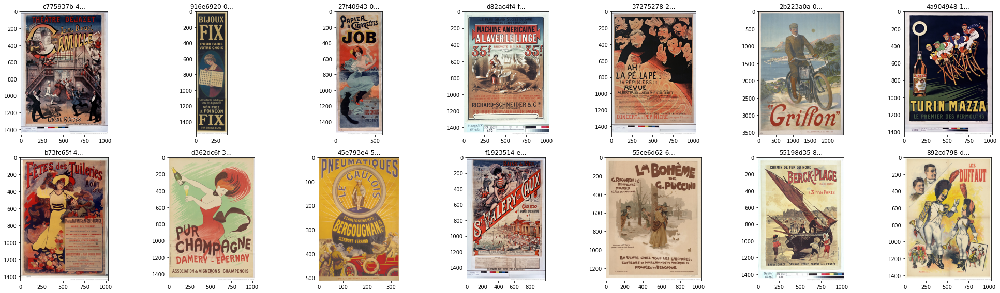

In [ ]:
visualize_sample_images(num_images_to_visualize = 14,  images_per_row = 7)

# Clean dataset

## Deduplicate posters images

In order to deduplicate images, we use image hashes (fingerprinting)

In [ ]:
#how it works
im = pilim.open("/content/gdrive/My Drive/belle_epoque/museums_collections/e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg")
im_hash = imagehash.average_hash(im, hash_size = 8)
print(type(im_hash))

print(im_hash)
bool_arr = im_hash.hash 
print(bool_arr)
binary_arr = 1* im_hash.hash 
print(binary_arr)
#flatten it
binary_list = list(binary_arr.flatten())
print(binary_list)
binary_arr_flattened = np.array(binary_list, dtype = np.uint8)
print(binary_arr_flattened)
print(binary_arr_flattened.shape)

<class 'imagehash.ImageHash'>
818189899181adff
[[ True False False False False False False  True]
 [ True False False False False False False  True]
 [ True False False False  True False False  True]
 [ True False False False  True False False  True]
 [ True False False  True False False False  True]
 [ True False False False False False False  True]
 [ True False  True False  True  True False  True]
 [ True  True  True  True  True  True  True  True]]
[[1 0 0 0 0 0 0 1]
 [1 0 0 0 0 0 0 1]
 [1 0 0 0 1 0 0 1]
 [1 0 0 0 1 0 0 1]
 [1 0 0 1 0 0 0 1]
 [1 0 0 0 0 0 0 1]
 [1 0 1 0 1 1 0 1]
 [1 1 1 1 1 1 1 1]]
[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 0 1 0
 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1]
(64,)


In [ ]:
def constuct_dict_hashes(list_files, hash_alg = "average", num_bytes = 8):
    """ for each image in a list of filepaths, compute image hash and return
        a dict keyed on image hash and valued on a list of filepaths that have
        that fingerprint """
    
    dict_hashes = {}

    for imgfile in list_files:
        im = pilim.open(imgfile)
        if hash_alg == "average":
            im_hash = imagehash.average_hash(im, hash_size = num_bytes)
        elif hash_alg == "percept":
            im_hash = imagehash.phash(im, hash_size = num_bytes)
        elif hash_alg == "diff":
            im_hash = imagehash.dhash(im, hash_size = num_bytes)
        elif hash_alg == "color":
            im_hash = imagehash.colorhash(im, binbits = 3)
        else:
            raise "Algo not supported for hashing: " + hash_alg
        im_filename = imgfile.split("/")[-1] 
        if im_hash not in dict_hashes:
            dict_hashes[im_hash] = [im_filename]
        else:
            dict_hashes[im_hash].append(im_filename)  

    return dict_hashes

In [ ]:
def find_similar_candidates_in_list(list_candidates, hash_alg = "average", num_bytes = 16):
    """ given a list of images filepaths, build a dict keyed by image hash and then 
        iterate its keys to compute distance between all pairs of hashes, recording in a list 
        this difference aloong with the two lists of participating filenames  """
    
    dict_hashes_candidates = constuct_dict_hashes(list_files = list_candidates,  hash_alg = hash_alg, num_bytes = num_bytes)

    #this time the hashes don't rrepeat, but we can compute distance between these
    list_pairs = []
    list_keys = list(dict_hashes_candidates.keys())
    for ii in range(len(list_keys)):
        kk1 = list_keys[ii]
        binary_arr1 = 1* kk1.hash
        binary_list1 = list(binary_arr1.flatten())

        for jj in range(ii+1,len(list_keys)):
            kk2 = list_keys[jj]
            binary_arr2 = 1* kk2.hash
            binary_list2 = list(binary_arr2.flatten())

            diff_hashes = kk1 - kk2
            list_pairs.append((dict_hashes_candidates[kk1], dict_hashes_candidates[kk2], diff_hashes))


    #sort list
    list_pairs_ordered = sorted(list_pairs, key = lambda el: el[2])

    #top 5 closest hashes correspond to pairs:
    return list_pairs_ordered[0:5]

------------------ AVERAGE HASH
(['e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg'], ['70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg'], 54)
(['e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg'], ['a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg'], 55)
(['70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg'], ['a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg'], 57)
------------------ PERCEPTUAL HASH
(['e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg'], ['70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg'], 86)
(['70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg'], ['a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg'], 130)
(['e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg'], ['a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg'], 134)
------------------ DIFF HASH
(['e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg'], ['70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg'], 71)
(['e2d7e92f-8a3c-

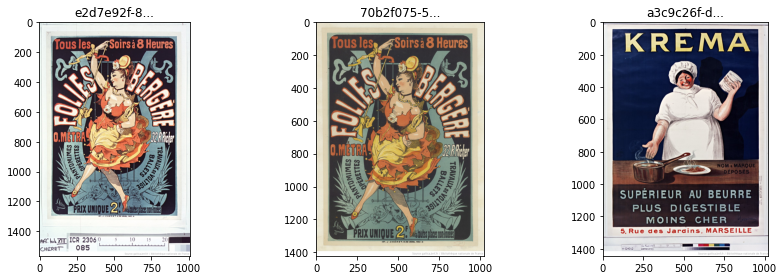

In [ ]:
#illustrating how it works
list_candidates_triplet = [
        "/content/gdrive/My Drive/belle_epoque/museums_collections/e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg",
        "/content/gdrive/My Drive/belle_epoque/museums_collections/70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg",
        "/content/gdrive/My Drive/belle_epoque/museums_collections/a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg"]

visualize_list_images(list_images = list_candidates_triplet)

print("------------------ AVERAGE HASH")
simil_a = find_similar_candidates_in_list(list_candidates = list_candidates_triplet, 
                                          hash_alg = "average", num_bytes = 16)
for tup in simil_a:
    print(tup)
print("------------------ PERCEPTUAL HASH")
simil_p = find_similar_candidates_in_list(list_candidates = list_candidates_triplet, 
                                          hash_alg = "percept", num_bytes = 16)
for tup in simil_p:
    print(tup)
print("------------------ DIFF HASH")
simil_d = find_similar_candidates_in_list(list_candidates = list_candidates_triplet,
                                          hash_alg = "diff", num_bytes = 16)
for tup in simil_d:
    print(tup)

We decide to work with perceptual hashing.  Now compute for all images:

In [ ]:
%%time
dict_hashes_candidates = constuct_dict_hashes(list_files = list_jpgfiles,  
                                              hash_alg = "percept",
                                              num_bytes = 16)

CPU times: user 1min 6s, sys: 1e+03 ms, total: 1min 7s
Wall time: 13min 48s


In [ ]:
print(len(list(dict_hashes_candidates.keys())), " entries in dict")

#example of an entry in the dict
k0 = list(dict_hashes_candidates.keys())[0]
v0 = dict_hashes_candidates[k0]
print("key:", k0)
print("value:", v0)

1639  entries in dict
key: bbf03ed0b52e6967c64f24da9cb11b97d32cd0698452d2cfa768c438f007d06d
value: ['3de49040-1ac8-4739-a157-2a71ec288025.Cheret_Jules.jpg']


In [ ]:
!rm -f "/content/gdrive/My Drive/belle_epoque/dict_hashes_candidates.pickle"

In [ ]:
#pickle it
with open("/content/gdrive/My Drive/belle_epoque/dict_hashes_candidates.pickle", 'wb') as f:
    pickle.dump(dict_hashes_candidates, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#a data structure that will keep track for each file if it's unique or not

dict_files_verdicts = {}

for imgfile in list_jpgfiles:
    filename = imgfile.split("/")[-1]
    dict_files_verdicts[filename] = []

In [ ]:
num_dups = sum([1 for k,v in dict_files_verdicts.items() if len(v)!= 0])
print("Already %d files marked as dupicates of others" % num_dups)

Already 9 files marked as dupicates of others


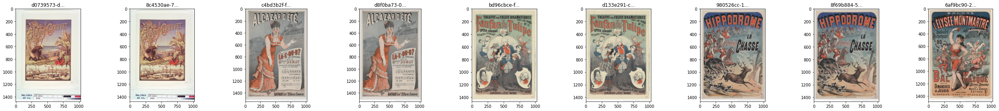

In [ ]:
#check if any collisions already
list_collisions = []
for k, v in dict_hashes_candidates.items():
    if len(v) > 1:
        #mark in the dict_files_verdicts, so that only the first in v remains unmarked
        for el in v[1:]:
            dict_files_verdicts[el] = v
        list_collisions.extend([FOLDER_IMAGES + el for el in v])

n = min(9, len(list_collisions))
visualize_list_images(list_images = list_collisions[0:n], images_per_row= n)

We index all perceptual hashes in an Annoy index, keeping track separately of the relationship between the Annoy id and the hash and the filename

In [ ]:
%%time

annoy_index = AnnoyIndex(16 * 16, metric="hamming")

list_order = []
ii = 0

for k,v in dict_hashes_candidates.items():
    #make the hash flattened binary
    binary_arr = 1* k.hash 
    binary_list = list(binary_arr.flatten())
    binary_arr_flattened = np.array(binary_list, dtype = np.uint8)
    #add to index
    annoy_index.add_item(ii, binary_arr_flattened)
    list_order.append(k)
    ii += 1


annoy_index.build(3) # number of trees
annoy_index.save("/tmp/annoy_images_hashes.ann")

CPU times: user 274 ms, sys: 19.3 ms, total: 294 ms
Wall time: 260 ms


In [ ]:
!rm -f "/content/gdrive/My Drive/belle_epoque/annoy_images_hashes.ann"
!rm -f "/content/gdrive/My Drive/belle_epoque/list_order.pickle"


!cp /tmp/annoy_images_hashes.ann  "/content/gdrive/My Drive/belle_epoque/"
!du -h  "/content/gdrive/My Drive/belle_epoque/annoy_images_hashes.ann"

139K	/content/gdrive/My Drive/belle_epoque/annoy_images_hashes.ann


In [ ]:
#pickle the list
with open("/content/gdrive/My Drive/belle_epoque/list_order.pickle", 'wb') as f:
    pickle.dump(list_order, f, protocol=pickle.HIGHEST_PROTOCOL)

Restore index:

In [ ]:
%%time
annoy_index_restored = AnnoyIndex(256, metric="hamming")
annoy_index_restored.load("/tmp/annoy_images_hashes.ann") # super fast, will just mmap the file


CPU times: user 64 µs, sys: 3 µs, total: 67 µs
Wall time: 73.7 µs


BIG NOTE: ANNOY PERFORMS APPROXIMATE MATCHING, AND THE HIGHER THE K IN K-NN THE BETTER THE RESULTS

This means that if we ask 10 nearest neighbors we may get results which are farther apart from the query point than if we ask 200 nearest neighbors to it.

see also: https://github.com/spotify/annoy/issues/470

e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg
[1594, 1087, 1595, 1438, 42, 750, 287, 732, 1488, 1558]  .....
[0.0, 84.0, 86.0, 88.0, 92.0, 92.0, 94.0, 94.0, 94.0, 94.0]  .....
70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg
[1595, 1594, 1404, 1558, 479, 904, 1536, 395, 409, 648]  .....
[0.0, 86.0, 92.0, 92.0, 94.0, 94.0, 94.0, 96.0, 96.0, 96.0]  .....
a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg
[1553, 1344, 355, 649, 1367, 1110, 9, 29, 443, 722]  .....
[0.0, 88.0, 92.0, 94.0, 94.0, 96.0, 98.0, 98.0, 98.0, 98.0]  .....
{'70b2f075-543a-4bd6-87bb-f221543f081f.Cheret_Jules.jpg': 1595,
 'a3c9c26f-d74e-4b1b-9860-31f2ff52ecf7.Cappiello_Leonetto.jpg': 1553,
 'e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg': 1594}
dd= 116.0


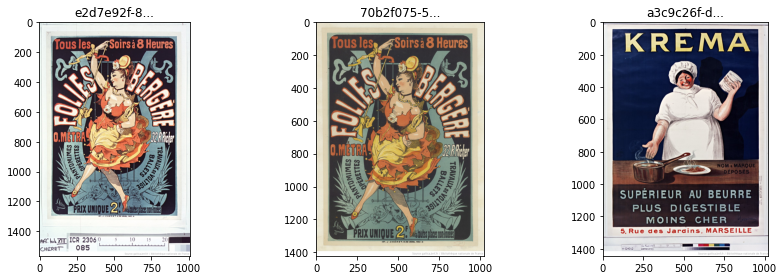

In [ ]:
#illustrate on the triplet used before
d_aux3 = constuct_dict_hashes(list_files = list_candidates_triplet,  
                             hash_alg = "percept", num_bytes = 16)

dict_ids_annoy3 = {}

#check nearest neighbors for each of the 3 hashes (recap k3 is a hash, v3 is a list of files with that hash)
for k3, v3 in d_aux3.items():
    the_filename = v3[0]
    print(the_filename)
    #make the hash flattened binary
    binary_arr = 1* k3.hash 
    binary_list = list(binary_arr.flatten())
    binary_arr_flattened = np.array(binary_list, dtype = np.uint8)
    neigh3 = annoy_index_restored.get_nns_by_vector(binary_arr_flattened, 200,
                                                    search_k = -1, 
                                                    include_distances=True )
    print(neigh3[0][0:10], " .....")
    print(neigh3[1][0:10], " .....")
    #their own ids in the annoy index corresp to distance = 0
    if neigh3[1][0] == 0:
        dict_ids_annoy3[the_filename] = neigh3[0][0]
    print("================================================================")

pprint.pprint(dict_ids_annoy3)

#from the output we'll learn that the corresponding annoy indices or the 3 hashes are: [464, 465, 423]
dd = annoy_index_restored.get_distance(464,465)
print("dd=", dd)

visualize_list_images(list_images = list_candidates_triplet)

Now query for all ids:

In [ ]:
#now query it for each unique hash 
num_neigh =  200
thresh_similar = 82
min_dist = 9999
max_dist = -1

registered_duplicates = {}

for ii in range(len(list_order)):
    nearest_neighbors = annoy_index_restored.get_nns_by_item(ii, num_neigh, search_k = -1, include_distances=True)
    #the result is a tuple with 2 lists: of indices and of distances. The nearest neighbors include the queried item at distance 0.0
    list_ids = nearest_neighbors[0]
    list_distances = nearest_neighbors[1]    
    filtered_ids = [list_ids[jj] for jj in range(1,num_neigh) if (list_distances[jj]< thresh_similar)]
    if len(filtered_ids) > 0: 
        #mark as seen
        for jj in filtered_ids:
            registered_duplicates[(ii,jj)] = 1
            registered_duplicates[(jj,ii)] = 1
    #update
    if min(list_distances[1:]) < min_dist:
        min_dist = min(list_distances[1:])
    elif max(list_distances[1:]) > max_dist:
        max_dist = max(list_distances[1:])

print("minimum distance between any pair of hashes in the tree is:", min_dist)
print("maximum distance between any pair of hashes in the tree is:", max_dist)

minimum distance between any pair of hashes in the tree is: 24.0
maximum distance between any pair of hashes in the tree is: 130.0


In [ ]:
list_pairs_similar_hashes = list(registered_duplicates.keys())
print("number of pairs of hashes found similar=", len(list_pairs_similar_hashes) / 2)
print("Example of pairs of similar hashes:", list_pairs_similar_hashes[0:20])

number of pairs of hashes found similar= 52.0
Example of pairs of similar hashes: [(90, 182), (182, 90), (106, 239), (239, 106), (119, 1423), (1423, 119), (136, 1233), (1233, 136), (160, 423), (423, 160), (166, 195), (195, 166), (169, 386), (386, 169), (174, 395), (395, 174), (208, 240), (240, 208), (208, 241), (241, 208)]


In [ ]:
#first take only one of (a,b), (b,a)
list_pairs_similar_hashes_halved = list_pairs_similar_hashes[0::2]

#group this list of tuples by the tuple's first component
dict_adjacency = {}
aux = 0
for ii, g in groupby(list_pairs_similar_hashes_halved, operator.itemgetter(0)):
    the_group = list(g)
    ids_in_group = [el[1] for el in the_group]
    dict_adjacency[ii] = ids_in_group
    if aux < 5:
        print(ii, "||", the_group, "==>", ids_in_group , end = " ==> ")
        print(dict_adjacency)
        
    aux += 1

90 || [(90, 182)] ==> [182] ==> {90: [182]}
106 || [(106, 239)] ==> [239] ==> {90: [182], 106: [239]}
119 || [(119, 1423)] ==> [1423] ==> {90: [182], 106: [239], 119: [1423]}
136 || [(136, 1233)] ==> [1233] ==> {90: [182], 106: [239], 119: [1423], 136: [1233]}
160 || [(160, 423)] ==> [423] ==> {90: [182], 106: [239], 119: [1423], 136: [1233], 160: [423]}



Depending on the threshold considered, it may be possible at this point to encounter the following case entries in dict_ajacency:

```
i1 : [i2,i3],
i3 : [i4], 
i4: [i5]
```

To combile these into a single similarity group, we make use of a graph and its connecteed components, computed with NetworkX package:

In [ ]:
#networkx graph from adj lists
G = nx.from_dict_of_lists(dict_adjacency)

aux = 0

#extract connected components
connectcomponents = nx.connected_components(G)
list_of_list_hashes_similar = []

for connectcompon in list(connectcomponents):
    list_members = list(connectcompon)
    list_of_list_hashes_similar.append(list_members)
    aux += 1

print("{} connected components found".format(aux))
list_of_list_hashes_similar[0:5]

47 connected components found


[[90, 182], [106, 238, 239], [1423, 119], [136, 1233], [160, 423]]

Now, what remains to be done is to decode these Annoy ids back to the hashes using *list_order* and then back into filenames using *dict_hashes_candidates*

In [ ]:
list_similarities = []

for similar_ids in list_of_list_hashes_similar:
    merged_lists = []
    for id in similar_ids: 
        the_hash = list_order[id]
        list_files_hash = dict_hashes_candidates[the_hash]
        merged_lists.extend(list_files_hash)
    list_similarities.append(merged_lists)

Illustrate groups of similar images:


In [ ]:
#create a joker image to be inserted after each set of similar images
fig, ax = plt.subplots(1,1, figsize = (10, 10))
ax.set_xlim(0,100)
ax.set_ylim(0,100)
rect = Rectangle((40,40),20,20, facecolor = "blue")
ax.add_patch(rect)
ax.axis('off')
fig.savefig("/tmp/jocker.png")
plt.close()

In [ ]:
l_aux_with_jokercard = []
for sublist in list_similarities:
    l_aux_with_jokercard.extend([FOLDER_IMAGES + el for el in sublist])
    l_aux_with_jokercard.append("/tmp/jocker.png")

#a selection of images found similar
list_indicess_to_illustrate = list( set(list(range(0,10))) | set(list(range(69,75))) \
                                   | set(list(range(102,105))) | set(list(range(120,128))) )
print(list_indicess_to_illustrate)
visualize_list_images(list_images = [l_aux_with_jokercard[ii] for ii in list_indicess_to_illustrate], images_per_row= 9)

Note: the pre-last pair is wrongly perceived as similar (at the num bytes used for hashing and at the threshold we used)

In [ ]:
#mark files as duplicated
jj = 0
l_aux = []

for sublist in list_similarities:
    #except from first item, mark all others as duplicated
    for ii in range(len(sublist)):
        filename = sublist[ii]
        if (jj not in examples_mispaired) and (ii != 0):
            #union of existing value with the new similars
            dict_files_verdicts[filename] = list(set(dict_files_verdicts[filename]) | set(sublist))
            #print("will mark %s" % filename)
            l_aux.append(FOLDER_IMAGES + filename)
        jj += 1
    jj+= 1 #for jocker card
    


In [ ]:
num_dups = sum([1 for k,v in dict_files_verdicts.items() if len(v)!= 0])
list_dups = [k for k,v in dict_files_verdicts.items() if len(v)!= 0]
print("Now %d files marked as dupicates of others" % num_dups)

print("examples:")
pprint.pprint(list_dups[0:5])

Now 54 files marked as dupicates of others
examples:
['399154f2-5558-44d3-99dd-01947d5b44e4.web.jpg',
 'ead6eef1-973c-41bd-8077-39814dc4abae.jpg',
 'ad098afb-ba3e-41da-8c7e-6f7f5fbd8fb7.poster.jpg',
 '6957ac25-d3d0-4f2a-b42c-d541bcee6d35.Cheret_Jules.jpg',
 '02d2eddb-d7e7-498d-8142-ada16aa725dd.Cheret_Jules.jpg']


In [ ]:
#rename these by prefixing "___" at the beginning of their filenames

for k,v in dict_files_verdicts.items():
    if len(v)!= 0:
        new_filename = "___" + k
        #print("{} --> {}".format(k, new_filename))
        os.rename(FOLDER_IMAGES + k, FOLDER_IMAGES + new_filename)


In [ ]:
%%bash -s "$FOLDER_IMAGES"

ls "$1" | grep "___" | wc -l

54


In [ ]:
!rm -f "/content/gdrive/My Drive/belle_epoque/dict_files_verdicts.pickle"

In [ ]:
#pickle
with open("/content/gdrive/My Drive/belle_epoque/dict_files_verdicts.pickle", 'wb') as f:
    pickle.dump(dict_files_verdicts, f, protocol=pickle.HIGHEST_PROTOCOL)

## Detect and crop out metadata on bottom border of images

Some images include some metadata in the bottom border, of varying height, example:

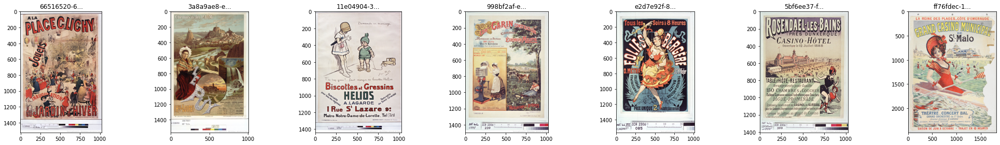

In [ ]:
list_with_bordermeta = ["/content/gdrive/My Drive/belle_epoque/museums_collections/66516520-6b49-4d82-977b-3d8bfd831a05.jpg",
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/3a8a9ae8-ea84-453a-92ae-674760f5f1b6.Hugo.jpg",
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/11e04904-30cc-4a43-9d60-8afdc980419d.Redon_Georges.jpg",
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/998bf2af-ed57-42d7-adb5-d5c74cf5b260.Gray_Henri.jpg",
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/e2d7e92f-8a3c-48b2-88ca-281a4c312dc4.Cheret_Jules.jpg",
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/5bf6ee37-f6d6-478e-9e93-d15a09a9753b.jpg",          
                        "/content/gdrive/My Drive/belle_epoque/museums_collections/ff76fdec-1e55-4455-8105-c0a87e91a54d.jpg"             
                        ]

visualize_list_images(list_images = list_with_bordermeta, images_per_row= 7)

The approach we take is based on color thresholds:

In [ ]:
def suggest_crop_bordermeta(filename, flag_debug = False):
    """ given the filename of an image, use color thresholding and morphological transforms
        to recommend a cropping height that would eliminate bottom metadata border """

    im_gray = cv2.imread(FOLDER_IMAGES + filename, cv2.IMREAD_GRAYSCALE) 
    h,w = im_gray.shape

    #set threshold
    lower_thresh = 10
    upper_thresh = 230
    im_cpy = np.zeros_like(im_gray)
    im_cpy[im_gray <= lower_thresh] = 1
    im_cpy[im_gray >= upper_thresh] = 1
    im_cpy[(im_gray > lower_thresh) & (im_gray < upper_thresh)] = 0
    #print(np.unique(im_cpy))   #would print [0 1]

    #apply morhological transformation to clean the black pixels on the poster useful area
    conv_size=3
    kernel = kernel = np.ones((conv_size,conv_size),np.uint8)
    conv_size2=5
    kernel2 = kernel = np.ones((conv_size2,conv_size2),np.uint8)
    im_transf = cv2.morphologyEx(im_cpy, cv2.MORPH_OPEN, kernel2)
    im_transf2 = cv2.morphologyEx(im_transf, cv2.MORPH_CLOSE, kernel2)
    im_transf3 = cv2.dilate(im_transf2,kernel,iterations = 7)

    #now get height where to crop
    #sum 1s by row
    sum_by_row = np.sum(im_transf3, axis = 1)
    assert (sum_by_row.shape[0] == h)
    #indices where we have too much black (i.e. 1s in the matrix)
    indices_candidates = np.where(sum_by_row > 0.7 * w)
    #print("indices candidates:", indices_candidates)
    #note: the result of np.where is a tuple
    indices_candidates = indices_candidates[0] 
    indices_candidates_lowerpart = indices_candidates[indices_candidates > int(0.85 * h)]
    #height_crop is the min among those in the lower 15% of the matrix
    if indices_candidates_lowerpart.shape[0] > 0:
        height_crop = min(indices_candidates_lowerpart)
    else:
        height_crop = h
    

    if flag_debug is True:
        print("height_crop=", height_crop)
        poster_cropped = im_gray[0:height_crop,:]

        fig,ax = plt.subplots(1,4, figsize = (30,10))
        ax[0].imshow(im_gray, cmap= "gray")
        ax[1].imshow(im_cpy, cmap="binary")
        ax[2].imshow(im_transf3, cmap="binary")
        ax[3].imshow(poster_cropped, cmap= "gray")
        fig.tight_layout()

    return height_crop

height_crop= 1349


1349

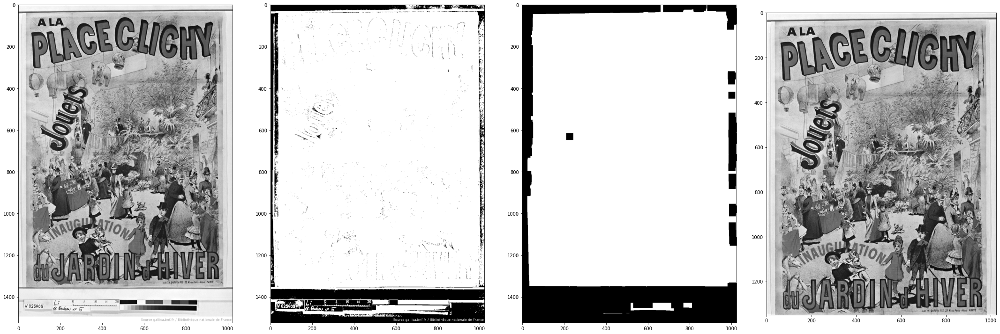

In [ ]:
suggest_crop_bordermeta(filename = (list_with_bordermeta[0]).split("/")[-1], flag_debug = True)

height_crop= 1332


1332

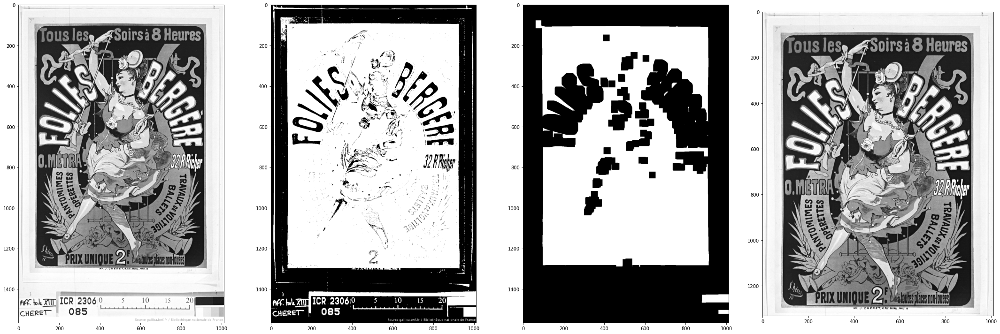

In [ ]:
suggest_crop_bordermeta(filename = (list_with_bordermeta[4]).split("/")[-1], flag_debug = True)

Now apply for all images and store the suggested cropping height in a dict keyed by filename

In [ ]:
%%time
suggest_crop_bordermeta(filename = list_with_bordermeta[0].split("/")[-1])

CPU times: user 31.4 ms, sys: 0 ns, total: 31.4 ms
Wall time: 37.5 ms


1349

In [ ]:
list_jpgfiles = glob.glob(FOLDER_IMAGES + '/*.jpg')
print("{} jpg files".format(len(list_jpgfiles)))

1648 jpg files


In [ ]:
%%time
dict_cropping = {}
for filepath in list_jpgfiles:
    filename = filepath.split("/")[-1]
    suggested_cropping_height = suggest_crop_bordermeta(filename)
    dict_cropping[filename] = suggested_cropping_height

print(len(list(dict_cropping.keys())), " entries in dict_cropping")

1648  entries in dict_cropping
CPU times: user 42.9 s, sys: 1.57 s, total: 44.5 s
Wall time: 10min 32s


In [ ]:
!rm -f "/content/gdrive/My Drive/belle_epoque/dict_cropping_height.pickle"

In [ ]:
#pickle it
with open("/content/gdrive/My Drive/belle_epoque/dict_cropping_height.pickle", 'wb') as f:
    pickle.dump(dict_cropping, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#load pickled file
with open("/content/gdrive/My Drive/belle_epoque/dict_cropping_height.pickle", 'rb') as f:
    dict_cropping_ = pickle.load(f)

In [ ]:
k0 = list(dict_cropping_.keys())[0]
print(k0, " should be cropped at:", dict_cropping[k0])

8a086281-65b4-4fa3-82a5-2435fd9e914d.Grasset.jpg  should be cropped at: 899


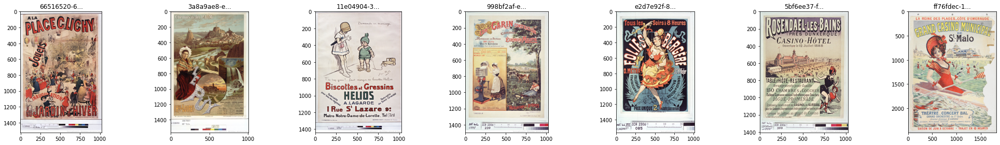

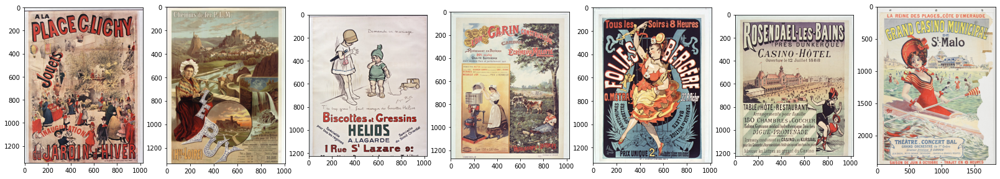

In [ ]:
#illustrate result
n = len(list_with_bordermeta)
#before
visualize_list_images(list_images = list_with_bordermeta, images_per_row= n)

#after
fig, ax = plt.subplots(1,n, figsize = (n * 4, 6))

ii = 0
for filepath in list_with_bordermeta:
    filename = filepath.split("/")[-1]
    suggested_crop = dict_cropping_.get(filename)
    im = pilim.open(filepath)
    arr = np.array(im)
    arr_cropped = arr[0:suggested_crop,:]
    ax[ii].imshow(arr_cropped)

    ii += 1

Store cropped posters in a new folder:

In [ ]:
!mkdir -p "/content/gdrive/My Drive/belle_epoque/posters_cropped"

In [ ]:
list_jpgfiles = glob.glob(FOLDER_IMAGES + '/*.jpg')
FOLDER_IMAGES_CROP = "/content/gdrive/My Drive/belle_epoque/posters_cropped/"

ii = 0
for filepath in list_jpgfiles:
    filename = filepath.split("/")[-1]
    #if key not in dict will return default -1
    suggested_crop = dict_cropping_.get(filename, -1)
    if suggested_crop != -1:
        im = pilim.open(filepath)
        arr = np.array(im)
        arr_cropped = arr[0:suggested_crop,:]
        result_BGR = cv2.cvtColor(arr_cropped, cv2.COLOR_RGB2BGR)
        cv2.imwrite(FOLDER_IMAGES_CROP + filename, result_BGR)
        ii += 1

print(ii)

1648


In [ ]:
!ls "/content/gdrive/My Drive/belle_epoque/posters_cropped" | wc -l

1648


# Data Annotations

Three classes were annotated on the images:
- culture
- tourism
- retail


In [ ]:
!tail -c 368 "/content/gdrive/My Drive/belle_epoque/labels_affiches.json"

e":"7c989f41-7b8e-4e71-81c7-dcec633eeb0e.Barrere_Adrien.jpg","annotations":["culture"]},{"image":"bd124da7-cbff-4e19-95c0-3c735f5bf1e9.Armengol_Henri.jpg","annotations":["culture"]},{"image":"29651cee-8640-49ea-b8d0-f815554416b8.Poulbot_Francisque.jpg","annotations":["culture"]},{"image":"b0080e3a-274a-4b40-823a-494b0c91a886.Ylen_Jean.jpg","annotations":["retail"]}]

In [ ]:
df_annot = pd.read_json("/content/gdrive/My Drive/belle_epoque/labels_affiches.json")
df_annot = df_annot[~df_annot["image"].str.startswith("___")]

print(df_annot.shape[0], " rows")

df_annot["label"] = df_annot["annotations"].apply(lambda x: x[0])
df_annot.rename(columns={"image": "filename"}, inplace=True)


df_annot.tail()

1591  rows


,filename,annotations,label
1640,901d4c55-a2ed-4ee8-a64b-c6433e30dcb8.Carrer_Fonction.jpg,[culture],culture
1641,7c989f41-7b8e-4e71-81c7-dcec633eeb0e.Barrere_Adrien.jpg,[culture],culture
1642,bd124da7-cbff-4e19-95c0-3c735f5bf1e9.Armengol_Henri.jpg,[culture],culture
1643,29651cee-8640-49ea-b8d0-f815554416b8.Poulbot_Francisque.jpg,[culture],culture
1644,b0080e3a-274a-4b40-823a-494b0c91a886.Ylen_Jean.jpg,[retail],retail


In [ ]:
print("{} rows".format(df_annot.shape[0]), "\n")

df_annot.groupby(by = ["label"])["filename"].count()

1591 rows 



label
culture    746
retail     630
tourism    215
Name: filename, dtype: int64

We observe imbalanced classes, tourism being the less represented. We'll address this by using class weights.

## Visualize sample images per class

In [ ]:
FOLDER_IMAGES_CROP = "/content/gdrive/My Drive/belle_epoque/posters_cropped/"

In [ ]:
def get_sample_per_class(label, sample_size = 5, flag_visualize = False):
    """ extract a sample of images corresponding to a specified label for display"""
    
    df_aux = df_annot[df_annot["label"] == label].sample(sample_size)
    list_files_sample = list(df_aux["filename"].values)

    if flag_visualize is True:
        l_aux = [FOLDER_IMAGES_CROP + el for el in list_files_sample]
        visualize_list_images(list_images = l_aux, images_per_row= 7)

    return list_files_sample

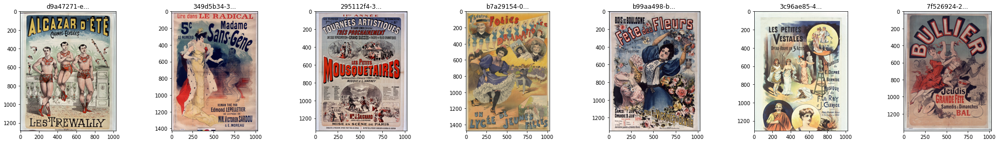

In [ ]:
ex_culture = get_sample_per_class(label = "culture", sample_size = 7, flag_visualize = True)

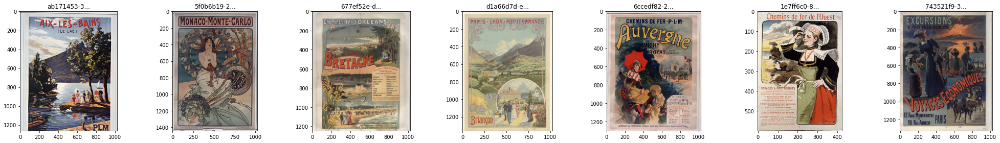

In [ ]:
ex_tourism = get_sample_per_class(label = "tourism", sample_size = 7, flag_visualize = True)

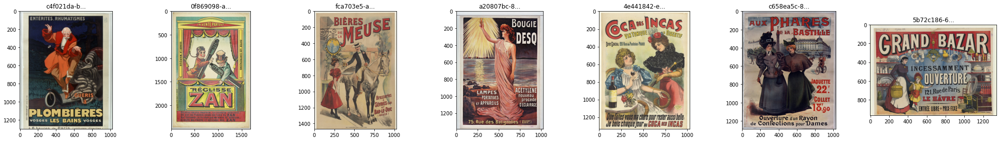

In [ ]:
ex_retail = get_sample_per_class(label = "retail", sample_size = 7, flag_visualize = True)

## Stratified train - test split

In [ ]:
#stratified split tran - test on the dataframe that will be basis for the image generator

df_train_valid, df_test = train_test_split(df_annot, test_size=0.05, random_state=10, 
                                     stratify=df_annot[["label"]])
df_test["role"] = "test"

df_train, df_valid = train_test_split(df_train_valid, test_size=0.2, random_state=10, 
                                      stratify=df_train_valid[["label"]])

df_train["role"] = "train"
df_valid["role"] = "valid"

df_concat = pd.concat([df_train, df_valid, df_test])

print(df_concat.shape)
df_concat.sample(5)

(1591, 4)


,filename,annotations,label,role
527,892cd798-d0bf-441d-97d0-ce0d3b3c7f93.Faria_Candido.jpg,[culture],culture,train
217,807b75f2-ad12-42ce-9ac3-ca28cca677e0.jpg,[retail],retail,train
1010,0f08103a-ffbb-4228-ab1f-0c89c1d89c2b.Choubrac_Leon.jpg,[culture],culture,train
958,751a7414-a21f-4437-a9f7-52982ced21f9.Oge_Eugene.jpg,[retail],retail,train
1534,b6bb7ccc-6a74-4244-822b-49dafa88e7ab.web.jpg,[retail],retail,train


In [ ]:
df_concat.groupby(by=["role","label"])["filename"].count()

role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64

**Save to file**

In [ ]:
df_concat.to_json("/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json", orient = "records")

In [ ]:
!du -h "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"

188K	/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json


## Class weights

In [ ]:
#establish class weights

arr_labels_train = df_concat[df_concat["role"]=="train"]["label"].values
dict_counts = coll.Counter(list(arr_labels_train))
print("dict_counts=",dict_counts)

max_count = max(dict_counts.values())
print("max_count=", max_count)

#round to 2 decimals
def ceil_2decimals(n):
    factor = 10 ** 2
    res = math.ceil(factor * n)
    return res / factor

dict_weights_computed ={k: ceil_2decimals(max_count/v)  for k,v in dict_counts.items()}
print("If we were to use formula based: \n dict_weights_computed =", dict_weights_computed)


dict_counts= Counter({'culture': 567, 'retail': 478, 'tourism': 163})
max_count= 567
If we were to use formula based: 
 dict_weights_computed = {'retail': 1.19, 'culture': 1.0, 'tourism': 3.48}


## Optionally, copy images to subfolders

Optionally, copy annotated images to subfolders according to their label

In [ ]:
%%bash

rm -r -f "/content/gdrive/My Drive/belle_epoque/annot/"

declare -a arr1=("train" "valid" "test")
declare -a arr2=("culture" "retail" "tourism")

for item1 in ${arr1[*]} 
do
        for item2 in ${arr2[*]} 
        do
            new_folder="/content/gdrive/My Drive/belle_epoque/annot/$item1/$item2" 
            echo $new_folder
            mkdir -p "$new_folder"
        done
done


/content/gdrive/My Drive/belle_epoque/annot/train/culture
/content/gdrive/My Drive/belle_epoque/annot/train/retail
/content/gdrive/My Drive/belle_epoque/annot/train/tourism
/content/gdrive/My Drive/belle_epoque/annot/valid/culture
/content/gdrive/My Drive/belle_epoque/annot/valid/retail
/content/gdrive/My Drive/belle_epoque/annot/valid/tourism
/content/gdrive/My Drive/belle_epoque/annot/test/culture
/content/gdrive/My Drive/belle_epoque/annot/test/retail
/content/gdrive/My Drive/belle_epoque/annot/test/tourism


In [ ]:
!tree "/content/gdrive/My Drive/belle_epoque/annot/"

/content/gdrive/My Drive/belle_epoque/annot/
├── test
│   ├── culture
│   ├── retail
│   └── tourism
├── train
│   ├── culture
│   ├── retail
│   └── tourism
└── valid
    ├── culture
    ├── retail
    └── tourism

12 directories, 0 files


In [ ]:
%%time
for i,row in df_concat.iterrows():
    shutil.copyfile(src = FOLDER_IMAGES_CROP + row["filename"], 
                    dst = FOLDER_IMAGES_ANNOT + row["role"] + "/" + row["label"] + "/" + row["filename"] )

CPU times: user 2.03 s, sys: 2.22 s, total: 4.25 s
Wall time: 13min 35s


**Now, with multiprocessing:**

In [ ]:
%%bash

rm -r -f "/content/gdrive/My Drive/belle_epoque/annot/"

declare -a arr1=("train" "valid" "test")
declare -a arr2=("culture" "retail" "tourism")

for item1 in ${arr1[*]} 
do
        for item2 in ${arr2[*]} 
        do
            new_folder="/content/gdrive/My Drive/belle_epoque/annot/$item1/$item2" 
            echo $new_folder
            mkdir -p "$new_folder"
        done
done

/content/gdrive/My Drive/belle_epoque/annot/train/culture
/content/gdrive/My Drive/belle_epoque/annot/train/retail
/content/gdrive/My Drive/belle_epoque/annot/train/tourism
/content/gdrive/My Drive/belle_epoque/annot/valid/culture
/content/gdrive/My Drive/belle_epoque/annot/valid/retail
/content/gdrive/My Drive/belle_epoque/annot/valid/tourism
/content/gdrive/My Drive/belle_epoque/annot/test/culture
/content/gdrive/My Drive/belle_epoque/annot/test/retail
/content/gdrive/My Drive/belle_epoque/annot/test/tourism


In [ ]:
num_cpus = psutil.cpu_count(logical=False)
print(num_cpus, " CPUs")
num_cores = psutil.cpu_count(logical=True)
print(num_cores, " Cores")

1  CPUs
2  Cores


In [ ]:
#sidenote
df_concat.iloc[100: 105]

,filename,annotations,label,role
1453,05a018c9-bfbb-4f65-81eb-e3da34c2d3a8.jpg,[retail],retail,train
434,b7246adb-238d-49c7-bfb1-98c74225ecc3.jpg,[culture],culture,train
850,9cfa72e1-3915-4b07-b8fe-bb2a65d27777.jpg,[culture],culture,train
200,8721db43-ff0e-48e5-a9d3-4a8a0a639cae.Pean_Rene.jpg,[culture],culture,train
1539,189c68c1-3e64-4fcd-aea2-e1b9c912e045.web.jpg,[retail],retail,train


In [ ]:
def copy_list_files(idx_min, idx_max):
    """ given a dataframe and limits of a partition of its rows, copy those files to a new folder.
      this function will be used in a threadpool below """

    df_aux = df_concat.iloc[idx_min: idx_max]
    print("Thread processing {} items".format(df_aux.shape[0]))
    for i,row in df_aux.iterrows():
        shutil.copyfile(src = FOLDER_IMAGES_CROP + row["filename"], 
                        dst = FOLDER_IMAGES_ANNOT + row["role"] + "/" + row["label"] + "/" + row["filename"] )

In [ ]:
range_splits = np.array_split(range( df_concat.shape[0] ), 4)

list_input = [(min(el), max(el)) for el in range_splits]
list_input

[(0, 397), (398, 795), (796, 1193), (1194, 1590)]

In [ ]:
%%time

num_threads = 4
with ThreadPool(num_threads) as tp:
    arr_results = tp.starmap(copy_list_files, list_input)

Thread processing 397 items
Thread processing 397 items
Thread processing 397 items
Thread processing 396 items
CPU times: user 2.65 s, sys: 2.68 s, total: 5.34 s
Wall time: 4min 3s
